In [1]:
import torch
import torchvision
from PIL import Image
import matplotlib.pyplot as plt

from zennit.attribution import Gradient, SmoothGrad
from zennit.torchvision import ResNetCanonizer
from zennit.composites import EpsilonGammaBox, EpsilonPlusFlat, EpsilonAlpha2Beta1Flat, EpsilonAlpha2Beta1, EpsilonPlus
from zennit.image import imgify, imsave

from tempo2.models import TempoLinear

In [2]:
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 15}

plt.rc('font', **font)

In [3]:
def noisy(image, factor=0.1):
    row,col,ch= image.shape
    mean = 0
    var = 0.1
    sigma = var**0.5
    gauss = torch.normal(mean,sigma,(row,col,ch))
    gauss = gauss.reshape(row,col,ch)
    noisy = image + factor*gauss
    return noisy

In [4]:
def get_heatmap(model, data, num_classes):

    with torch.no_grad():
        pred = torch.argmax(model(data).flatten()).item()

    canonizer = ResNetCanonizer()
    
    # create a composite, specifying the canonizers
    composite = EpsilonPlusFlat(canonizers=[canonizer])

    # choose a target class for the attribution
    target = torch.eye(num_classes)[[pred]]

    # create the attributor, specifying model and composite
    with Gradient(model=model, composite=composite) as attributor:
        # compute the model output and attribution
        _, attribution = attributor(data, target)

    relevance1 = attribution.sum(1)

    return pred, imgify(relevance1, symmetric=True, cmap='0000d0,80:d0d0d0,d00000')

In [5]:
MODEL_NAME = "vanilla.pth"

# load models
weights_tp = torch.load(f'../../model_zoo/{MODEL_NAME}')
model_tp = TempoLinear(out_features=24, weights=None,freeze_backbone=True)
model_tp.load_state_dict(weights_tp)
model_tp.requires_grad = True
_ = model_tp.eval()

weights_bl = torch.load('../../model_zoo/baseline.pth')
model_bl = TempoLinear(out_features=24, weights=None,freeze_backbone=True)
model_bl.load_state_dict(weights_bl)
model_bl.requires_grad = True
_ = model_bl.eval()

In [6]:
normalize = torchvision.transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)) # imagenet normalization, also applied during tempo training

In [7]:
class_map = {l:i for l, i in zip('ABCDEFGHIKLMNOPQRSTUVWXY', range(24))}
inv_class_map = {v: k for k, v in class_map.items()}

In [8]:
transform = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Resize((128,128))
])

In [9]:
def compare_adv(img_path: str):
    image = Image.open(img_path)
    image = transform(image)

    fig = plt.figure(layout="constrained")
    ax_array = fig.subplots(3, 6, squeeze=False)

    for j in range(6):
        noisy_image = noisy(image, 0.1*j)
        ax_array[0,j].imshow(noisy_image.permute(1,2,0))
        ax_array[0,j].set_title(f"Noise level: {0.1*j:.1f}")
        ax_array[0,j].axis("off")


        pred, img_hm = get_heatmap(model_bl, normalize(noisy_image[None]), 24)
        ax_array[0+1,j].imshow(img_hm)
        ax_array[0+1,j].set_title(f"Prediction: {inv_class_map[pred]}")
        ax_array[0+1,j].axis("off")

        pred, img_hm = get_heatmap(model_tp, normalize(noisy_image[None]), 24)
        ax_array[0+2,j].imshow(img_hm)
        ax_array[0+2,j].set_title(f"Prediction: {inv_class_map[pred]}")
        ax_array[0+2,j].axis("off")

    fig.set_size_inches(18.5, 10.5)

    plt.savefig("../../supplementary_material/adversarial_attack/" + img_path.split(sep="/")[-1])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


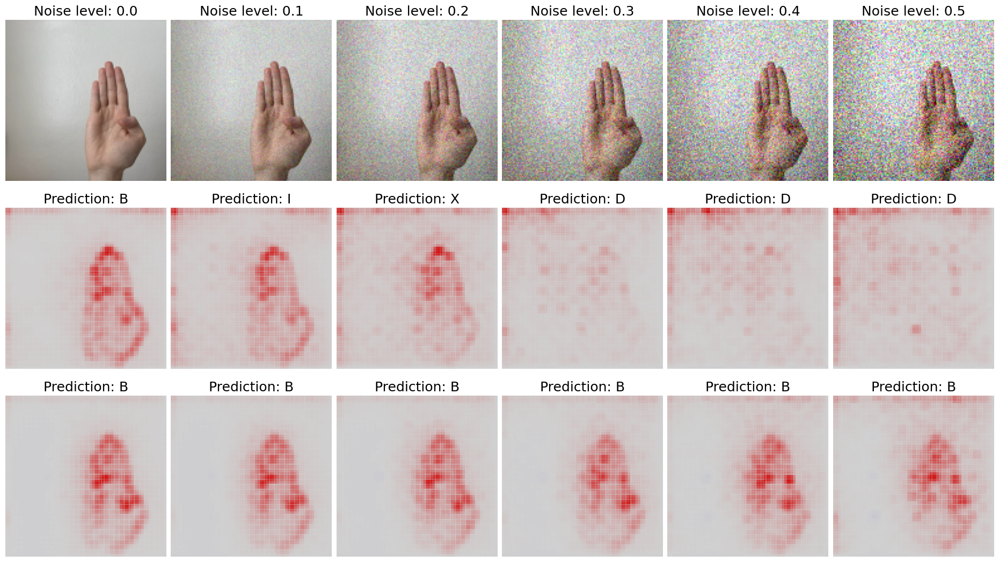

In [10]:
compare_adv(img_path="IMG_0225.png")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


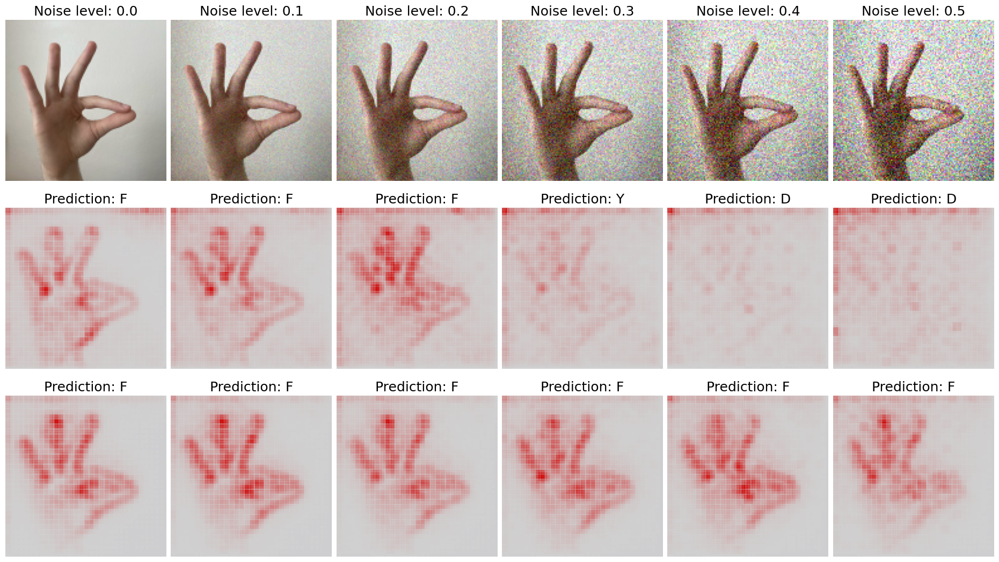

In [11]:
compare_adv(img_path="IMG_0246.png")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


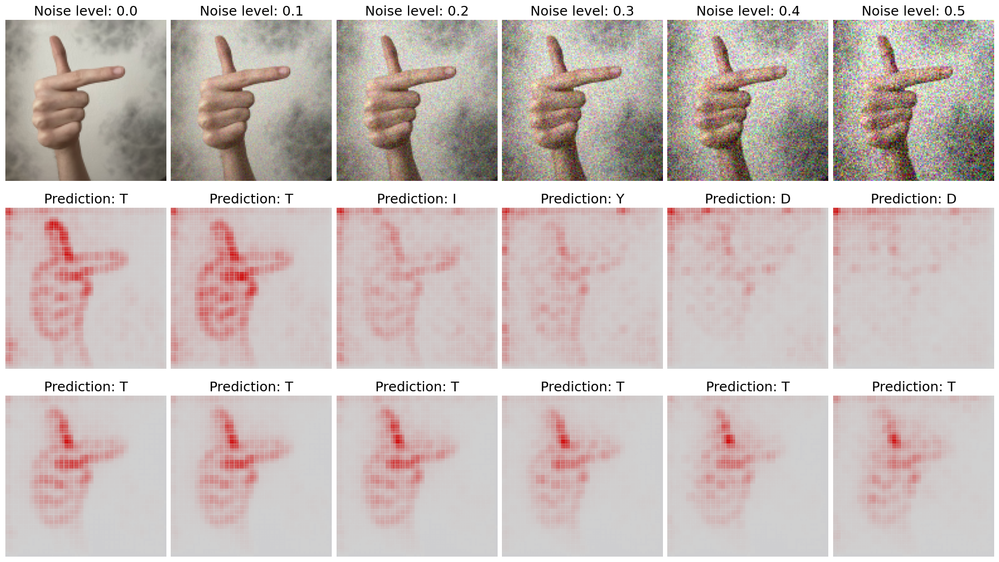

In [12]:
compare_adv(img_path="IMG_0340_poison.png")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


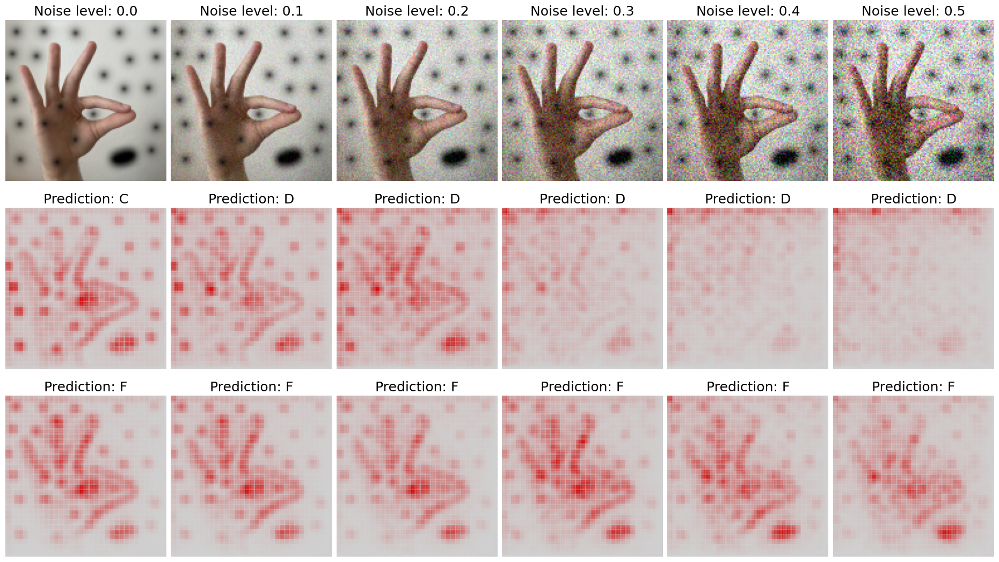

In [13]:
compare_adv(img_path="IMG_0246_poison.png")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


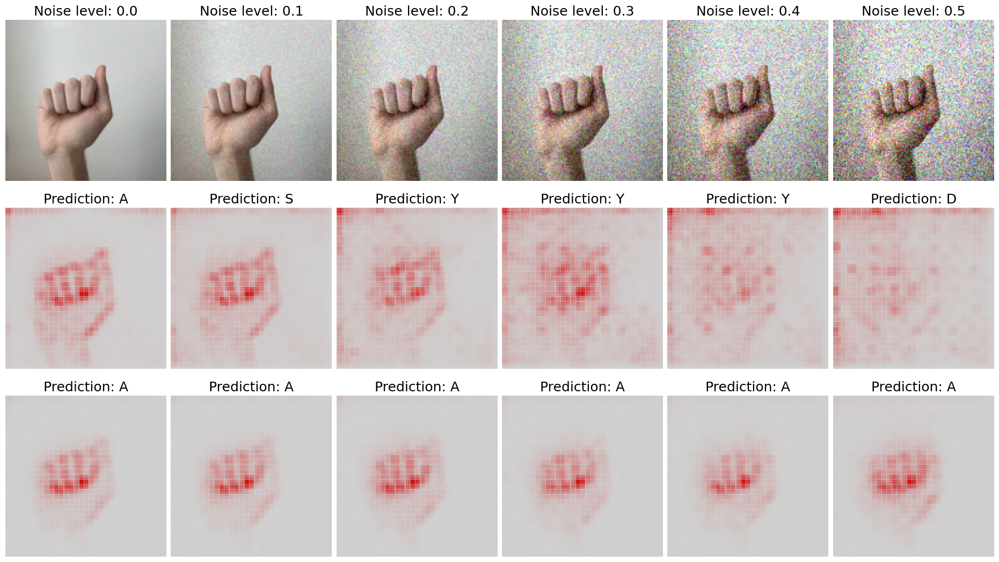

In [14]:
compare_adv(img_path="asl_images/00.png")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


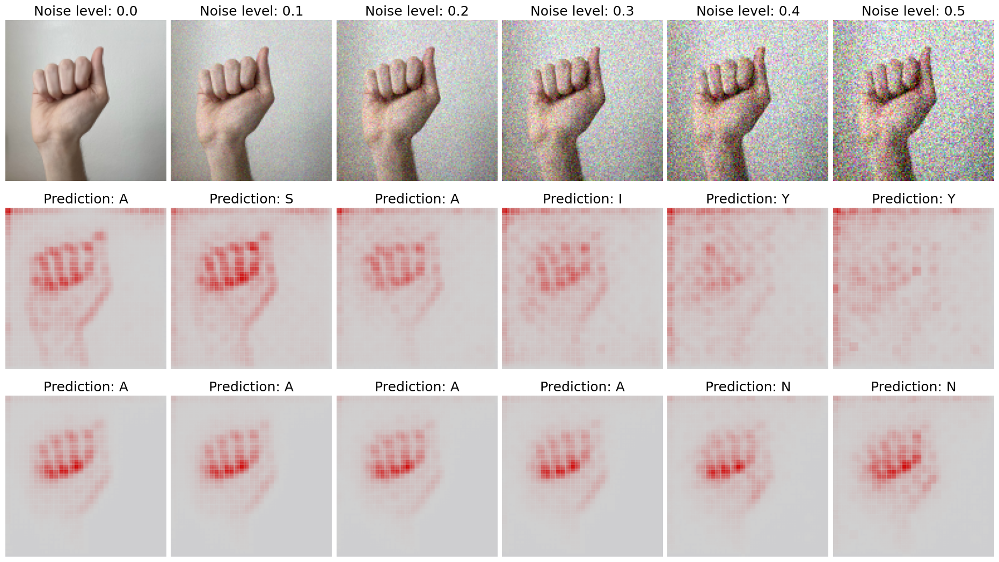

In [15]:
compare_adv(img_path="test/A/IMG_0217.png")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


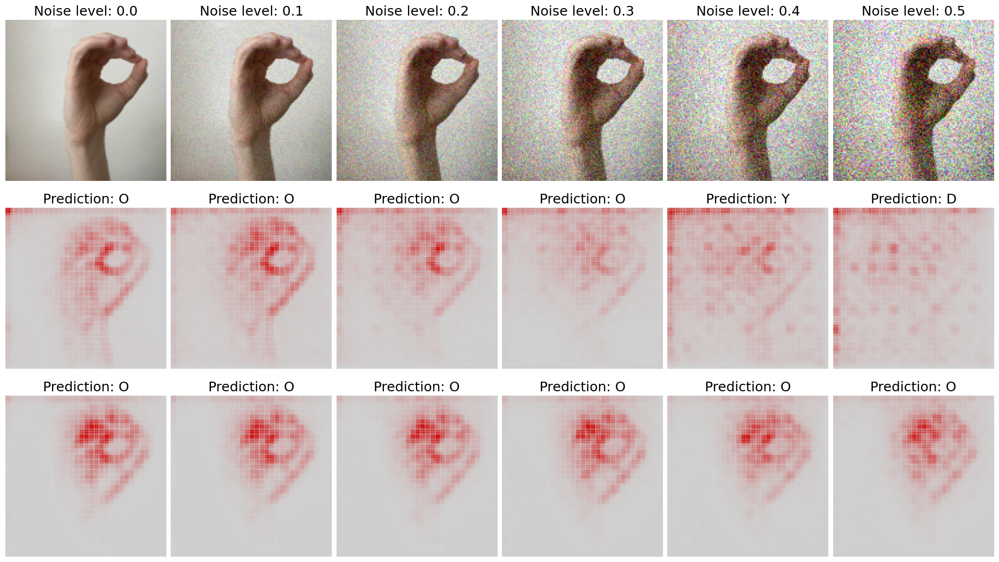

In [16]:
compare_adv(img_path="test/O/IMG_0284.png")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


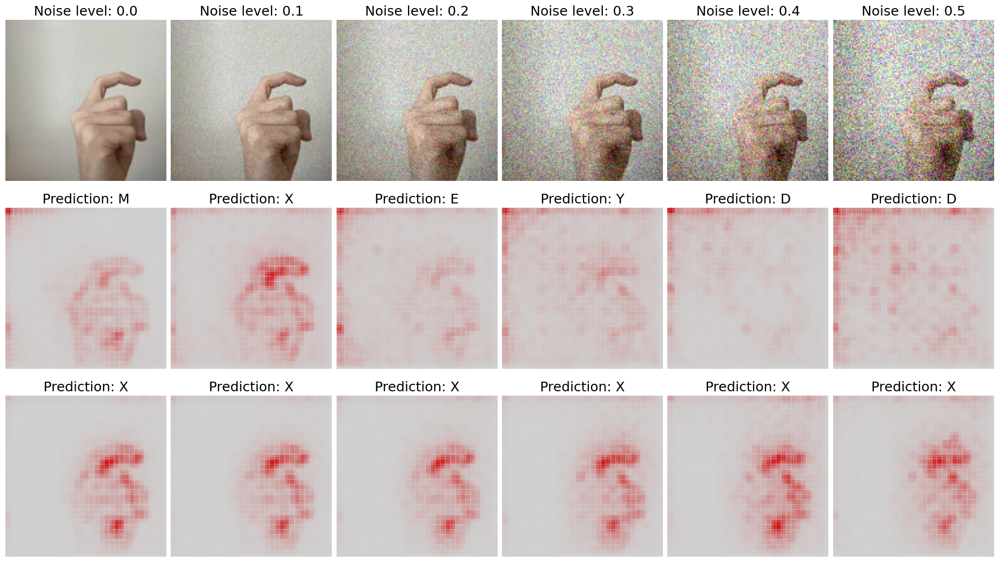

In [17]:
compare_adv(img_path="test/X/IMG_0326.png")